In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt

### Preprocessing

In [100]:
IMAGE_SIZE= 256
CHANNELS= 3
BATCH_SIZE = 32

In [12]:
import os

# Change the current working directory to the parent directory
os.chdir("..")

In [16]:
pwd

'd:\\Python Env\\venv'

In [268]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "CNN Project\Dataset"
)

Found 2152 files belonging to 3 classes.


<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\Jeevan\AppData\Local\Temp\ipykernel_18840\2704058294.py:2: SyntaxWarning: invalid escape sequence '\D'
  "CNN Project\Dataset"


In [18]:
class_names= dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [19]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[2 0 2 0 2 1 0 0 0 1 0 1 1 1 0 1 2 1 1 0 1 1 0 2 2 0 1 1 0 1 0 0]


In [25]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch[0].shape)

(256, 256, 3)


## Visualize the Images

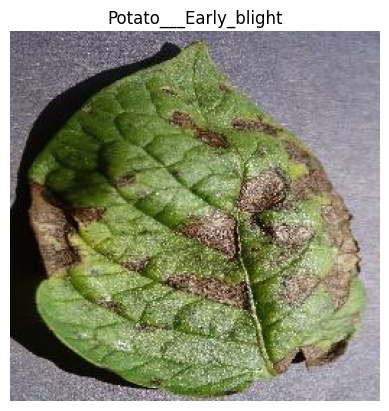

In [54]:
for image_batch, labels_batch in dataset.take(1):
    plt.imshow(image_batch[0]/255)
    plt.axis('off')
    plt.title(class_names[labels_batch[0]])

In [53]:
labels_batch

<tf.Tensor: shape=(32,), dtype=int32, numpy=
array([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 0, 2, 0, 1, 1, 1, 0], dtype=int32)>

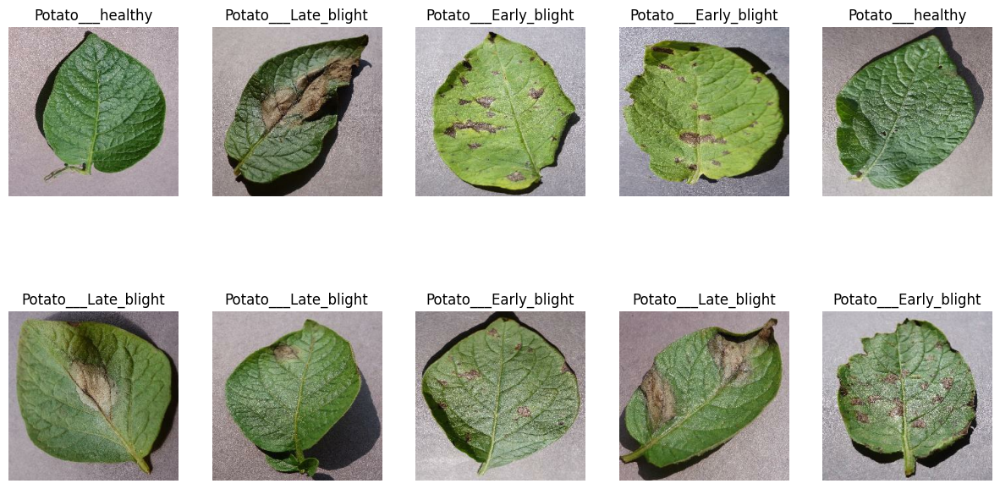

In [68]:
for image_batch, labels_batch in dataset.take(1):
    plt.figure(figsize=(15,8))
    for i in range (10):
        ax= plt.subplot(2,5,i+1)
        plt.imshow(image_batch[i]/255)
        plt.title(class_names[labels_batch[i]])
        plt.axis('off')
        

# Split the Data

In [69]:
len(dataset)

68

In [70]:
68*.8

54.400000000000006

In [71]:
68*.1

6.800000000000001

In [72]:
train_ds= dataset.take(54)

In [73]:
test_ds= dataset.skip(54)
val_dataset= test_ds.take(7)
test_ds= test_ds.skip(7)

In [76]:
print(len(test_ds))
print(len(val_dataset))

7
7


In [80]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = round(train_split * ds_size)
    val_size = round(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [84]:
train_ds, val_ds, test_ds= get_dataset_partitions_tf(dataset)

In [88]:
len(val_dataset)

7

In [89]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

# Preprocessing

In [92]:
from keras import Sequential
from tensorflow.keras.layers import Resizing, Rescaling

resize_and_rescale = Sequential([
    Resizing(IMAGE_SIZE, IMAGE_SIZE),
    Rescaling(1.0 / 255)
])



### Data Augmentation

In [93]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
])

# Model Building

In [111]:
from keras.models import Sequential

input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3


model= Sequential([
    resize_and_rescale,
    data_augmentation,
    #layers.Input(shape=input_shape),
    layers.Conv2D(32, (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax')
])


In [112]:
model.summary()

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_56 (Conv2D)              │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_57 (MaxPooling2D) │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_58 (MaxPooling2D) │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_59 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_60 (Conv2D)              │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_60 (MaxPooling2D) │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_61 (Conv2D)              │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_61 (MaxPooling2D) │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

## Compile

In [113]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

## Fit

In [114]:
history= model.fit(train_ds, epochs=10, verbose=1,validation_data=val_ds)

Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 199s 3s/step - accuracy: 0.4718 - loss: 0.9575 - val_accuracy: 0.6652 - val_loss: 0.7873
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - accuracy: 0.6796 - loss: 0.7430 - val_accuracy: 0.7455 - val_loss: 0.5903
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 36s 670ms/step - accuracy: 0.7597 - loss: 0.5564 - val_accuracy: 0.8125 - val_loss: 0.4356
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 561ms/step - accuracy: 0.8285 - loss: 0.3939 - val_accuracy: 0.9062 - val_loss: 0.3033
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 556ms/step - accuracy: 0.8680 - loss: 0.3162 - val_accuracy: 0.9241 - val_loss: 0.1795
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 561ms/step - accuracy: 0.9108 - loss: 0.2214 - val_accuracy: 0.9018 - val_loss: 0.2527
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 558ms/step - accuracy: 0.9049 - loss: 0.2414 - val_accuracy: 0.9598 - val_loss: 0.1435
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 560ms/step - accuracy: 0.9121 - loss: 0.2184 - val_accuracy

In [115]:
scores = model.evaluate(test_ds)

7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8970 - loss: 0.2847


# Plotting the Accuracy and Loss Curves

In [117]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [118]:
history.history['accuracy']

[0.5300925970077515,
 0.7280092835426331,
 0.7824074029922485,
 0.8501157164573669,
 0.8865740895271301,
 0.8987268805503845,
 0.9004629850387573,
 0.9103009104728699,
 0.9236111044883728,
 0.9340277910232544]

In [119]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

In [120]:
val_acc

[0.6651785969734192,
 0.7455357313156128,
 0.8125,
 0.90625,
 0.9241071343421936,
 0.9017857313156128,
 0.9598214030265808,
 0.90625,
 0.90625,
 0.8883928656578064]

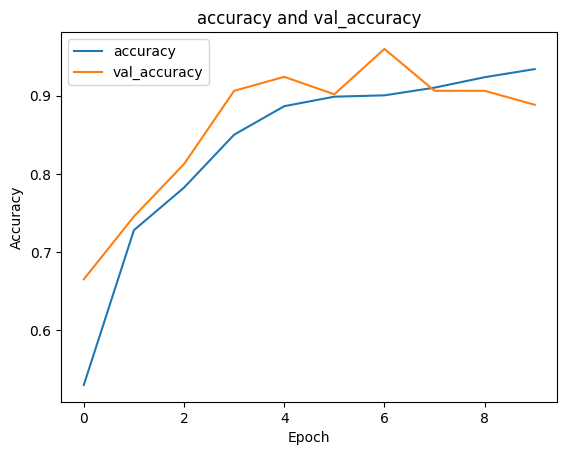

In [122]:
plt.plot(acc, label='accuracy')
plt.plot(val_acc, label='val_accuracy')
plt.title('accuracy and val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

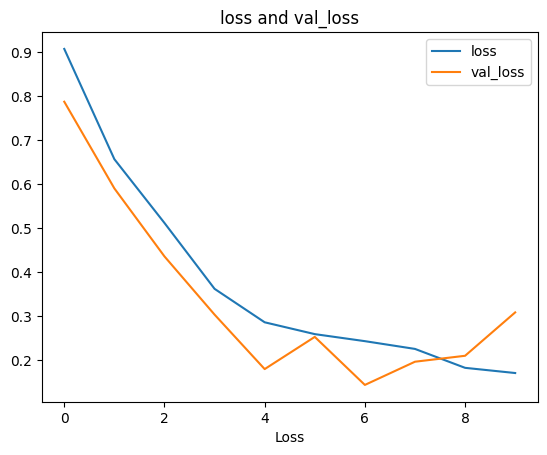

In [123]:
plt.plot(loss, label='loss')
plt.plot(val_loss, label='val_loss')
plt.title('loss and val_loss')
plt.xlabel('Loss')
plt.legend()

# Use ModelCheckpoint to Save the Best Model

In [124]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Save the model with highest validation accuracy
checkpoint = ModelCheckpoint(
    'best_model.h5',             # File to save weights
    monitor='val_accuracy',      # Metric to track
    mode='max',                  # Save max val_accuracy
    save_best_only=True,         # Only save if better than previous
    verbose=1                    # Print when saving
)

history = model.fit(
    train_ds,
    epochs=20,
    validation_data=val_ds,
    callbacks=[checkpoint]       # Add this callback
)

Epoch 1/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 936ms/step - accuracy: 0.9368 - loss: 0.1658
Epoch 1: val_accuracy improved from -inf to 0.94196, saving model to best_model.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - accuracy: 0.9368 - loss: 0.1658 - val_accuracy: 0.9420 - val_loss: 0.1472
Epoch 2/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 579ms/step - accuracy: 0.9512 - loss: 0.1230
Epoch 2: val_accuracy did not improve from 0.94196
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 596ms/step - accuracy: 0.9512 - loss: 0.1229 - val_accuracy: 0.9062 - val_loss: 0.2275
Epoch 3/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 548ms/step - accuracy: 0.9541 - loss: 0.1241
Epoch 3: val_accuracy improved from 0.94196 to 0.95536, saving model to best_model.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 577ms/step - accuracy: 0.9539 - loss: 0.1242 - val_accuracy: 0.9554 - val_loss: 0.1267
Epoch 4/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.9610 - loss: 0.1145
Epoch 4: val_accuracy did not improve from 0.95536
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 591ms/step - accuracy: 0.9611 - loss: 0.1143 - val_accuracy: 0.9330 - val_loss: 0.1711
Epoch 5/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 592ms/step - accuracy: 0.9618 - loss: 0.1132
Epoch 5: val_accuracy did not improve from 0.95536
54/54 ━━━━━━━━━━━━━━━━━━━━ 33s 609ms/step - accuracy: 0.9618 - loss: 0.1132 - val_accuracy: 0.9464 - val_loss: 0.1572
Epoch 6/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 568ms/step - accuracy: 0.9752 - loss: 0.0695
Epoch 6: val_accuracy did not improve from 0.95536
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 586ms/step - accuracy: 0.9751 - loss: 0.0697 - val_accuracy: 0.9464 - val_loss: 0.1431
Epoch 7/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 566ms/step - accuracy: 0.9714 - loss: 0.0826
Epoch 7: val_accuracy did not i

54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 573ms/step - accuracy: 0.9548 - loss: 0.1088 - val_accuracy: 0.9598 - val_loss: 0.1030
Epoch 10/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 606ms/step - accuracy: 0.9719 - loss: 0.0861
Epoch 10: val_accuracy improved from 0.95982 to 0.96875, saving model to best_model.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 34s 629ms/step - accuracy: 0.9719 - loss: 0.0862 - val_accuracy: 0.9688 - val_loss: 0.0737
Epoch 11/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.9663 - loss: 0.0898
Epoch 11: val_accuracy did not improve from 0.96875
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 593ms/step - accuracy: 0.9663 - loss: 0.0896 - val_accuracy: 0.9688 - val_loss: 0.0722
Epoch 12/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 588ms/step - accuracy: 0.9866 - loss: 0.0479
Epoch 12: val_accuracy did not improve from 0.96875
54/54 ━━━━━━━━━━━━━━━━━━━━ 33s 606ms/step - accuracy: 0.9865 - loss: 0.0481 - val_accuracy: 0.9420 - val_loss: 0.1503
Epoch 13/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - accuracy: 0.9772 - loss: 0.0600
Epoch 13: val_accuracy did not improve from 0.96875
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 584ms/step - accuracy: 0.9773 - loss: 0.0600 - val_accuracy: 0.9420 - val_loss: 0.1640
Epoch 14/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 566ms/step - accuracy: 0.9584 - loss: 0.0856
Epoch 14: val_accuracy d

54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 599ms/step - accuracy: 0.9752 - loss: 0.0646 - val_accuracy: 0.9911 - val_loss: 0.0330
Epoch 19/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 588ms/step - accuracy: 0.9792 - loss: 0.0479
Epoch 19: val_accuracy did not improve from 0.99107
54/54 ━━━━━━━━━━━━━━━━━━━━ 33s 605ms/step - accuracy: 0.9793 - loss: 0.0478 - val_accuracy: 0.9911 - val_loss: 0.0326
Epoch 20/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 576ms/step - accuracy: 0.9812 - loss: 0.0439
Epoch 20: val_accuracy did not improve from 0.99107
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 593ms/step - accuracy: 0.9813 - loss: 0.0439 - val_accuracy: 0.9688 - val_loss: 0.0776


# Evaluate the Model

In [125]:
model.load_weights('best_model.h5')

In [130]:
val_loss, val_accuracy = model.evaluate(val_ds)
print(f"Best validation accuracy: {val_accuracy:.4f}")

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - accuracy: 0.9954 - loss: 0.0245
Best validation accuracy: 0.9911


In [126]:
model.evaluate(val_ds)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - accuracy: 0.9858 - loss: 0.0346


[0.0330316387116909, 0.9910714030265808]

# Plotting the Accuracy and Loss Curves

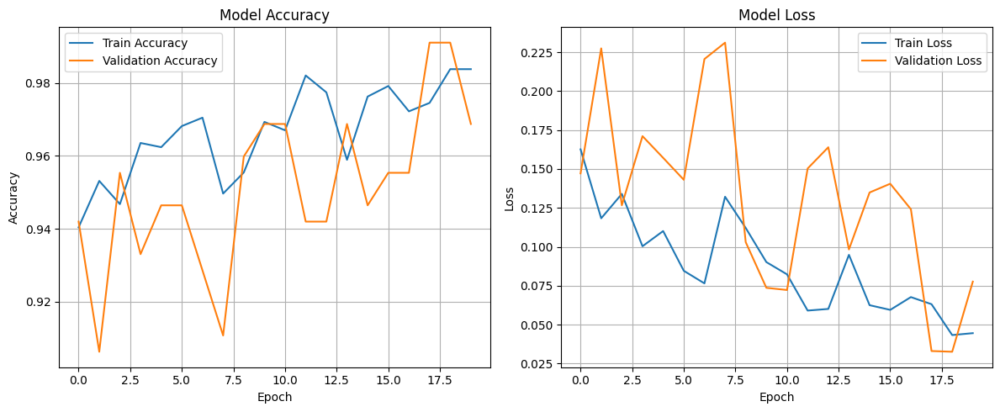

In [132]:
import matplotlib.pyplot as plt

# Plot Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

## Run prediction on a sample image

Image to predict
Actual Label - Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
Potato___Early_blight


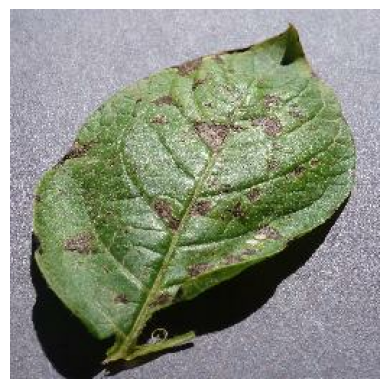

In [169]:
import numpy as np 
for image_batch, labels_batch in test_ds.take(1):
    

    image= image_batch[0].numpy().astype('uint8')
    label= labels_batch[0].numpy()

    print("Image to predict")
    plt.imshow(image_batch[0].numpy().astype('uint8'))
    print(f"Actual Label - {class_names[label]}")

    #Predicted Label
    batch_prediction= model.predict(image_batch)
    print(class_names[np.argmax(batch_prediction[0])])
    plt.axis("off")


# Write a function for inference

In [ ]:
def predict(model, img, class_names=['Early Blight', 'Late Blight', 'Healthy']):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

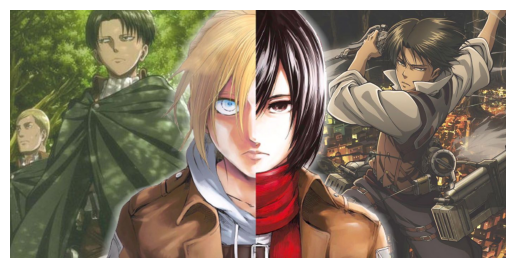

In [ ]:
from PIL import Image
import requests
from io import BytesIO

# Load the image from the URL
url = 'https://static1.cbrimages.com/wordpress/wp-content/uploads/2021/12/attack-on-titan-specials.jpg'
response = requests.get(url)
img = Image.open(BytesIO(response.content))

# Display the image
plt.imshow(img)
plt.axis('off')  # Optional: Turn off the axis
plt.show()

In [ ]:
tf.keras.preprocessing.image.img_to_array(url)

ValueError: could not convert string to float: 'https://static1.cbrimages.com/wordpress/wp-content/uploads/2021/12/attack-on-titan-specials.jpg'

In [182]:
pwd

'd:\\Python Env\\venv'

### Preprocessing

In [ ]:
IMAGE_SIZE= 256
CHANNELS= 3
BATCH_SIZE = 32

In [ ]:
import os

# Change the current working directory to the parent directory
os.chdir("..")

In [ ]:
pwd

'd:\\Python Env\\venv'

In [ ]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "CNN Project\Dataset"
)

Found 2152 files belonging to 3 classes.


<>:2: SyntaxWarning: invalid escape sequence '\D'
<>:2: SyntaxWarning: invalid escape sequence '\D'
C:\Users\Jeevan\AppData\Local\Temp\ipykernel_18840\2704058294.py:2: SyntaxWarning: invalid escape sequence '\D'
  "CNN Project\Dataset"


In [ ]:
class_names= dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [ ]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[2 0 2 0 2 1 0 0 0 1 0 1 1 1 0 1 2 1 1 0 1 1 0 2 2 0 1 1 0 1 0 0]


In [ ]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch[0].shape)

(256, 256, 3)


## Visualize the Images

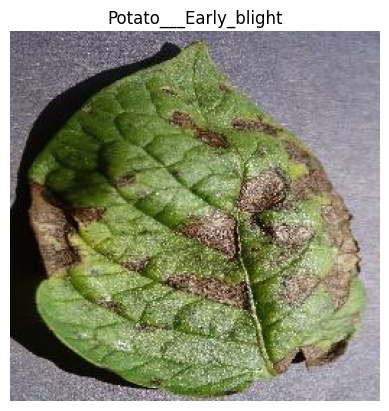

In [ ]:
for image_batch, labels_batch in dataset.take(1):
    plt.imshow(image_batch[0]/255)
    plt.axis('off')
    plt.title(class_names[labels_batch[0]])

In [ ]:
labels_batch

<tf.Tensor: shape=(32,), dtype=int32, numpy=
array([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 0, 2, 0, 1, 1, 1, 0], dtype=int32)>

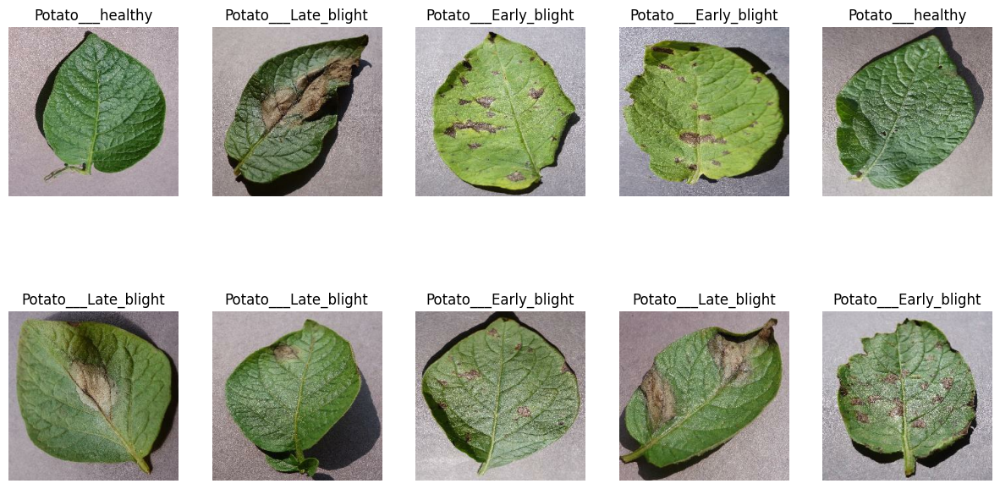

In [ ]:
for image_batch, labels_batch in dataset.take(1):
    plt.figure(figsize=(15,8))
    for i in range (10):
        ax= plt.subplot(2,5,i+1)
        plt.imshow(image_batch[i]/255)
        plt.title(class_names[labels_batch[i]])
        plt.axis('off')
        

# Split the Data

In [ ]:
len(dataset)

68

In [ ]:
68*.8

54.400000000000006

In [ ]:
68*.1

6.800000000000001

In [ ]:
train_ds= dataset.take(54)

In [ ]:
test_ds= dataset.skip(54)
val_dataset= test_ds.take(7)
test_ds= test_ds.skip(7)

In [ ]:
print(len(test_ds))
print(len(val_dataset))

7
7


In [ ]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = round(train_split * ds_size)
    val_size = round(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds= get_dataset_partitions_tf(dataset)

In [ ]:
len(val_dataset)

7

In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

# Preprocessing

In [ ]:
from keras import Sequential
from tensorflow.keras.layers import Resizing, Rescaling

resize_and_rescale = Sequential([
    Resizing(IMAGE_SIZE, IMAGE_SIZE),
    Rescaling(1.0 / 255)
])



### Data Augmentation

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
])

# Model Building

In [ ]:
from keras.models import Sequential

input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3


model= Sequential([
    resize_and_rescale,
    data_augmentation,
    #layers.Input(shape=input_shape),
    layers.Conv2D(32, (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax')
])


In [ ]:
model.summary()

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_56 (Conv2D)              │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_57 (MaxPooling2D) │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_58 (MaxPooling2D) │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_59 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_60 (Conv2D)              │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_60 (MaxPooling2D) │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_61 (Conv2D)              │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_61 (MaxPooling2D) │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

## Compile

In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

## Fit

In [ ]:
history= model.fit(train_ds, epochs=10, verbose=1,validation_data=val_ds)

Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 199s 3s/step - accuracy: 0.4718 - loss: 0.9575 - val_accuracy: 0.6652 - val_loss: 0.7873
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - accuracy: 0.6796 - loss: 0.7430 - val_accuracy: 0.7455 - val_loss: 0.5903
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 36s 670ms/step - accuracy: 0.7597 - loss: 0.5564 - val_accuracy: 0.8125 - val_loss: 0.4356
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 561ms/step - accuracy: 0.8285 - loss: 0.3939 - val_accuracy: 0.9062 - val_loss: 0.3033
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 556ms/step - accuracy: 0.8680 - loss: 0.3162 - val_accuracy: 0.9241 - val_loss: 0.1795
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 561ms/step - accuracy: 0.9108 - loss: 0.2214 - val_accuracy: 0.9018 - val_loss: 0.2527
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 558ms/step - accuracy: 0.9049 - loss: 0.2414 - val_accuracy: 0.9598 - val_loss: 0.1435
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 30s 560ms/step - accuracy: 0.9121 - loss: 0.2184 - val_accuracy

In [ ]:
scores = model.evaluate(test_ds)

7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8970 - loss: 0.2847


# Plotting the Accuracy and Loss Curves

In [ ]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
history.history['accuracy']

[0.5300925970077515,
 0.7280092835426331,
 0.7824074029922485,
 0.8501157164573669,
 0.8865740895271301,
 0.8987268805503845,
 0.9004629850387573,
 0.9103009104728699,
 0.9236111044883728,
 0.9340277910232544]

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

In [ ]:
val_acc

[0.6651785969734192,
 0.7455357313156128,
 0.8125,
 0.90625,
 0.9241071343421936,
 0.9017857313156128,
 0.9598214030265808,
 0.90625,
 0.90625,
 0.8883928656578064]

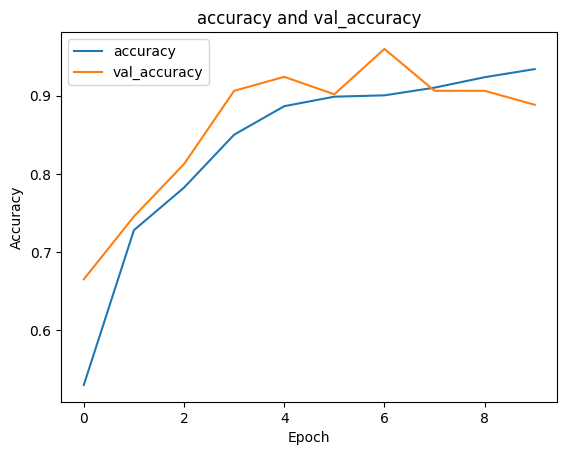

In [ ]:
plt.plot(acc, label='accuracy')
plt.plot(val_acc, label='val_accuracy')
plt.title('accuracy and val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

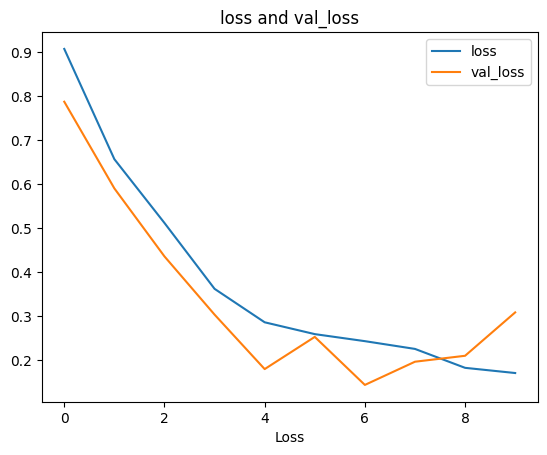

In [ ]:
plt.plot(loss, label='loss')
plt.plot(val_loss, label='val_loss')
plt.title('loss and val_loss')
plt.xlabel('Loss')
plt.legend()

# Use ModelCheckpoint to Save the Best Model

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Save the model with highest validation accuracy
checkpoint = ModelCheckpoint(
    'best_model.h5',             # File to save weights
    monitor='val_accuracy',      # Metric to track
    mode='max',                  # Save max val_accuracy
    save_best_only=True,         # Only save if better than previous
    verbose=1                    # Print when saving
)

history = model.fit(
    train_ds,
    epochs=20,
    validation_data=val_ds,
    callbacks=[checkpoint]       # Add this callback
)

Epoch 1/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 936ms/step - accuracy: 0.9368 - loss: 0.1658
Epoch 1: val_accuracy improved from -inf to 0.94196, saving model to best_model.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - accuracy: 0.9368 - loss: 0.1658 - val_accuracy: 0.9420 - val_loss: 0.1472
Epoch 2/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 579ms/step - accuracy: 0.9512 - loss: 0.1230
Epoch 2: val_accuracy did not improve from 0.94196
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 596ms/step - accuracy: 0.9512 - loss: 0.1229 - val_accuracy: 0.9062 - val_loss: 0.2275
Epoch 3/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 548ms/step - accuracy: 0.9541 - loss: 0.1241
Epoch 3: val_accuracy improved from 0.94196 to 0.95536, saving model to best_model.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 577ms/step - accuracy: 0.9539 - loss: 0.1242 - val_accuracy: 0.9554 - val_loss: 0.1267
Epoch 4/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.9610 - loss: 0.1145
Epoch 4: val_accuracy did not improve from 0.95536
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 591ms/step - accuracy: 0.9611 - loss: 0.1143 - val_accuracy: 0.9330 - val_loss: 0.1711
Epoch 5/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 592ms/step - accuracy: 0.9618 - loss: 0.1132
Epoch 5: val_accuracy did not improve from 0.95536
54/54 ━━━━━━━━━━━━━━━━━━━━ 33s 609ms/step - accuracy: 0.9618 - loss: 0.1132 - val_accuracy: 0.9464 - val_loss: 0.1572
Epoch 6/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 568ms/step - accuracy: 0.9752 - loss: 0.0695
Epoch 6: val_accuracy did not improve from 0.95536
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 586ms/step - accuracy: 0.9751 - loss: 0.0697 - val_accuracy: 0.9464 - val_loss: 0.1431
Epoch 7/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 566ms/step - accuracy: 0.9714 - loss: 0.0826
Epoch 7: val_accuracy did not i

54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 573ms/step - accuracy: 0.9548 - loss: 0.1088 - val_accuracy: 0.9598 - val_loss: 0.1030
Epoch 10/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 606ms/step - accuracy: 0.9719 - loss: 0.0861
Epoch 10: val_accuracy improved from 0.95982 to 0.96875, saving model to best_model.h5


54/54 ━━━━━━━━━━━━━━━━━━━━ 34s 629ms/step - accuracy: 0.9719 - loss: 0.0862 - val_accuracy: 0.9688 - val_loss: 0.0737
Epoch 11/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.9663 - loss: 0.0898
Epoch 11: val_accuracy did not improve from 0.96875
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 593ms/step - accuracy: 0.9663 - loss: 0.0896 - val_accuracy: 0.9688 - val_loss: 0.0722
Epoch 12/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 588ms/step - accuracy: 0.9866 - loss: 0.0479
Epoch 12: val_accuracy did not improve from 0.96875
54/54 ━━━━━━━━━━━━━━━━━━━━ 33s 606ms/step - accuracy: 0.9865 - loss: 0.0481 - val_accuracy: 0.9420 - val_loss: 0.1503
Epoch 13/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - accuracy: 0.9772 - loss: 0.0600
Epoch 13: val_accuracy did not improve from 0.96875
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 584ms/step - accuracy: 0.9773 - loss: 0.0600 - val_accuracy: 0.9420 - val_loss: 0.1640
Epoch 14/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 566ms/step - accuracy: 0.9584 - loss: 0.0856
Epoch 14: val_accuracy d

54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 599ms/step - accuracy: 0.9752 - loss: 0.0646 - val_accuracy: 0.9911 - val_loss: 0.0330
Epoch 19/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 588ms/step - accuracy: 0.9792 - loss: 0.0479
Epoch 19: val_accuracy did not improve from 0.99107
54/54 ━━━━━━━━━━━━━━━━━━━━ 33s 605ms/step - accuracy: 0.9793 - loss: 0.0478 - val_accuracy: 0.9911 - val_loss: 0.0326
Epoch 20/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 576ms/step - accuracy: 0.9812 - loss: 0.0439
Epoch 20: val_accuracy did not improve from 0.99107
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 593ms/step - accuracy: 0.9813 - loss: 0.0439 - val_accuracy: 0.9688 - val_loss: 0.0776


# Evaluate the Model

In [ ]:
model.load_weights('best_model.h5')

In [ ]:
val_loss, val_accuracy = model.evaluate(val_ds)
print(f"Best validation accuracy: {val_accuracy:.4f}")

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - accuracy: 0.9954 - loss: 0.0245
Best validation accuracy: 0.9911


In [ ]:
model.evaluate(val_ds)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - accuracy: 0.9858 - loss: 0.0346


[0.0330316387116909, 0.9910714030265808]

# Plotting the Accuracy and Loss Curves

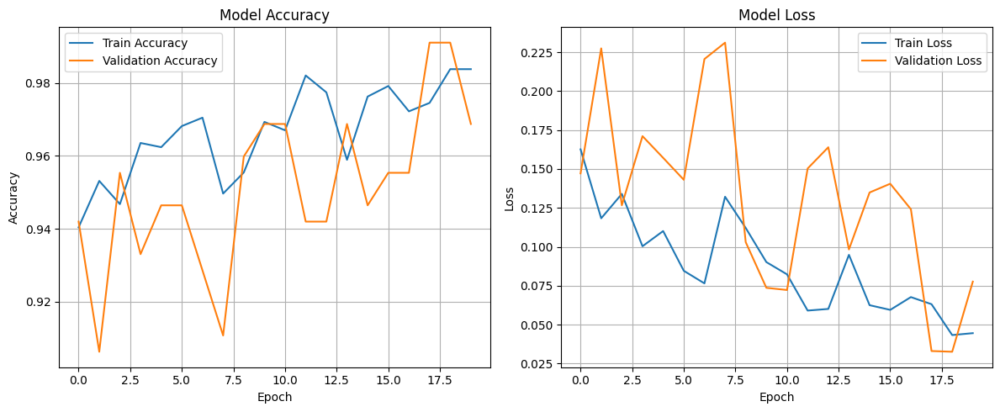

In [ ]:
import matplotlib.pyplot as plt

# Plot Accuracy
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

## Run prediction on a sample image

Image to predict
Actual Label - Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
Potato___Early_blight


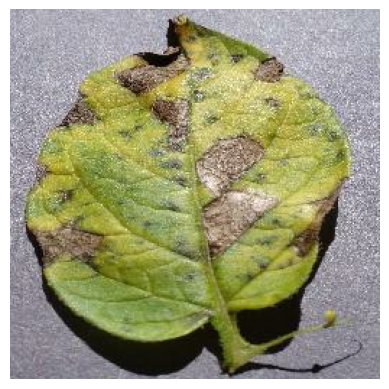

In [194]:
import numpy as np 
for image_batch, labels_batch in test_ds.take(1):
    

    image= image_batch[0].numpy().astype('uint8')
    label= labels_batch[0].numpy()

    print("Image to predict")
    plt.imshow(image_batch[0].numpy().astype('uint8'))
    print(f"Actual Label - {class_names[label]}")

    #Predicted Label
    batch_prediction= model.predict(image_batch)
    print(class_names[np.argmax(batch_prediction[0])])
    plt.axis("off")


# Write a function for inference

In [ ]:
def predict(model, img, class_names=['Early Blight', 'Late Blight', 'Healthy']):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i])
    img_array = tf.expand_dims(img_array, axis=0)
    #img_array = img_array / 255.0

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

### Now run inference on few sample images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


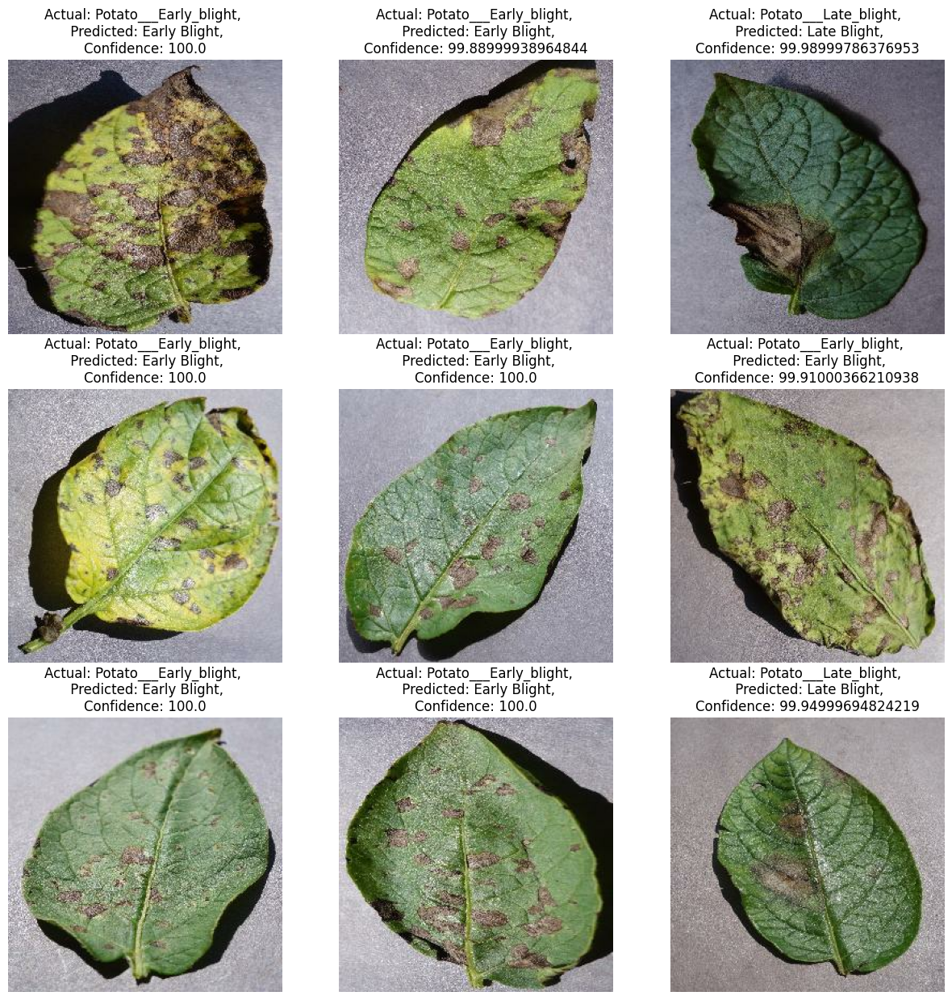

In [212]:
plt.figure(figsize=(15,15))

for images, labels in test_ds.take(1):
    for i in range(9):
        ax= plt.subplot(3,3,i+1)
        plt.imshow(images[i]/255)
        plt.axis("off")
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class= class_names[labels[i]]

        plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class},\nConfidence: {confidence}")

In [219]:
model.save(r'CNN Project\Models\model_1.keras')

#  Test on unseen images from Google

In [ ]:
early_blight_unseen = r'CNN Project\Unseen test'

In [243]:
early_blight_unseen

'CNN Project\\Unseen test'

In [264]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array


# Load your model (replace with your file or use trained model)
model = tf.keras.models.load_model('best_model.h5')  

# Folder with unseen images
unseen_folder = r'CNN Project\Unseen test'

# Prediction function (based on your earlier function, adapted for files)
def predict_image(model, image_path, class_names, image_size=256):
    # Load image
    image = load_img(image_path, target_size=(image_size, image_size))  # Resize to 256x256
    image = img_to_array(image)  # Convert to array (256, 256, 3)

    # Add batch dimension (model needs (1, 256, 256, 3))
    image = tf.expand_dims(image, axis=0)

    # Predict
    predictions = model.predict(image, verbose=0)
    predicted_index = np.argmax(predictions[0])
    predicted_class = class_names[predicted_index]
    confidence = round(100 * np.max(predictions[0]), 2)  # Confidence as percentage

    return predicted_class, confidence

# Loop through images in the folder
for filename in os.listdir(unseen_folder):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):  # Check for image files
        image_path = os.path.join(unseen_folder, filename)
        predicted_class, confidence = predict_image(model, image_path, class_names)
        print(f"Image: {filename}")
        print(f"Predicted: {predicted_class}")
        print(f"Confidence: {confidence}%")
        print("---")

Image: 1.png
Predicted: Potato___Early_blight
Confidence: 66.58000183105469%
---
Image: 2.jpg
Predicted: Potato___Early_blight
Confidence: 100.0%
---
Image: 3.png
Predicted: Potato___Early_blight
Confidence: 99.81999969482422%
---
Image: 4.jpg
Predicted: Potato___Late_blight
Confidence: 97.19000244140625%
---
Image: 5.jpg
Predicted: Potato___Early_blight
Confidence: 99.2300033569336%
---
Image: 5361639.jpg
Predicted: Potato___Early_blight
Confidence: 100.0%
---
Image: 6.jpg
Predicted: Potato___Early_blight
Confidence: 99.83999633789062%
---
Image: Halo-2-3-1080x675.jpg
Predicted: Potato___Early_blight
Confidence: 99.83999633789062%
---
Image: late.jpg
Predicted: Potato___Early_blight
Confidence: 65.95999908447266%
---
Image: late2.jpg
Predicted: Potato___Early_blight
Confidence: 99.9800033569336%
---
Image: late3.jpg
Predicted: Potato___Late_blight
Confidence: 90.30999755859375%
---
Image: late4.jpg
Predicted: Potato___Late_blight
Confidence: 73.55999755859375%
---
Image: late5.jpg
Pre

In [275]:
dataset_unseen = tf.keras.preprocessing.image_dataset_from_directory(r"CNN Project\Unseen test", labels=None)


Found 15 files.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


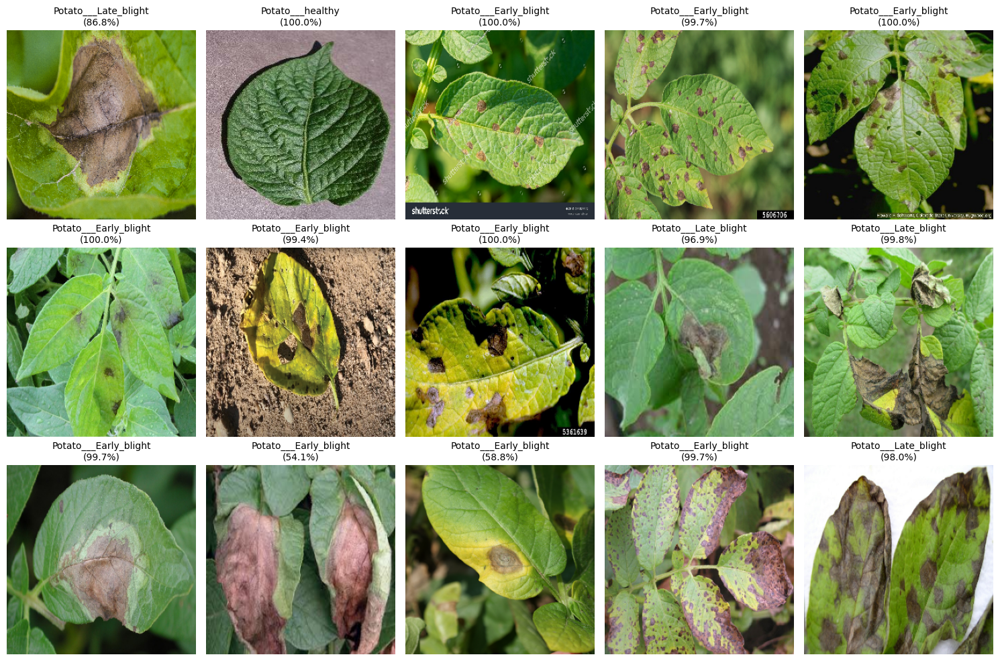

In [307]:
import numpy as np
import matplotlib.pyplot as plt



def predict_image(model, image, class_names):

    image = tf.expand_dims(image, axis=0)  # Add batch dimension

    # Predict
    predictions = model.predict(image)
    predicted_class = class_names[np.argmax(predictions)]
    confidence = 100 * np.max(predictions)
    return predicted_class, confidence

plt.figure(figsize=(15, 10))

# Process each image individually
for i, image in enumerate(dataset_unseen.unbatch().take(15)):  # Explicitly take 15 images
    # Predict
    predicted_class, confidence = predict_image(model, image, class_names)
    
    # Display
    ax = plt.subplot(3, 5, i+1)
    plt.imshow(image.numpy().astype('uint8'))  # Display original pixel values
    plt.title(f"{predicted_class}\n({confidence:.1f}%)", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Accuracy

In [299]:
# Evaluate on validation dataset
val_loss, val_accuracy = model.evaluate(val_ds, verbose=1)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

# Evaluate on test dataset
test_loss, test_accuracy = model.evaluate(test_ds, verbose=1)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")


7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.9921 - loss: 0.0235
Validation Accuracy: 99.11%
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.9952 - loss: 0.0161
Test Accuracy: 99.55%


In [303]:
pip install scikit-learn

  Using cached scikit_learn-1.6.1-cp312-cp312-win_amd64.whl.metadata (15 kB)
     ---------------------------------------- 0.0/60.8 kB ? eta -:--:--
     ------------ ------------------------- 20.5/60.8 kB 330.3 kB/s eta 0:00:01
     -------------------------------- ----- 51.2/60.8 kB 525.1 kB/s eta 0:00:01
     -------------------------------------- 60.8/60.8 kB 537.5 kB/s eta 0:00:00
Using cached scikit_learn-1.6.1-cp312-cp312-win_amd64.whl (11.1 MB)
   ---------------------------------------- 0.0/307.7 kB ? eta -:--:--
   ---------------------------------------  307.2/307.7 kB 9.6 MB/s eta 0:00:01
   ---------------------------------------- 307.7/307.7 kB 6.3 MB/s eta 0:00:00
   ---------------------------------------- 0.0/41.0 MB ? eta -:--:--
   ---------------------------------------- 0.4/41.0 MB 13.9 MB/s eta 0:00:03
    --------------------------------------- 0.9/41.0 MB 11.8 MB/s eta 0:00:04
   - -------------------------------------- 1.5/41.0 MB 11.7 MB/s eta 0:00:04
   - ---


[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [304]:
from sklearn.metrics import classification_report
import numpy as np

# Get true labels and predictions
y_true = []
y_pred = []

for images, labels in test_ds.unbatch():  # Iterate through all test data
    y_true.append(labels.numpy())
    pred = model.predict(tf.expand_dims(images, axis=0), verbose=0)
    y_pred.append(np.argmax(pred))

# Generate report
print(classification_report(
    y_true,
    y_pred,
    target_names=class_names  # ['Early Blight', 'Late Blight', 'Healthy']
))

                       precision    recall  f1-score   support

Potato___Early_blight       0.99      1.00      1.00       110
 Potato___Late_blight       1.00      0.99      1.00       101
     Potato___healthy       1.00      1.00      1.00        13

             accuracy                           1.00       224
            macro avg       1.00      1.00      1.00       224
         weighted avg       1.00      1.00      1.00       224

